In [1]:
!which python

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/bin/python


In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
from cicada.utils import data
from cicada.utils import models
from cicada.utils import visualisation as viz
from cicada import simulate as sim
# from cicada.simple_agent import SimpleAgent
from cicada.agent import Agent

In [4]:
from kaggle_environments.envs.football.helpers import human_readable_agent
from kaggle_environments import make

In [5]:
import numpy as np
import pandas as pd
from ipywidgets import interact
from copy import deepcopy
from tqdm.notebook import tqdm
import seaborn as sns
import json
import matplotlib.pyplot as plt
import statsmodels.api as sm

In [6]:
import lightgbm as lgb
from lightgbm import LGBMClassifier, LGBMRegressor
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import RidgeCV, RidgeClassifierCV
from sklearn.preprocessing import RobustScaler, PolynomialFeatures
from sklearn.pipeline import make_pipeline
import joblib

In [7]:
pd.options.display.max_columns = 999
pd.options.display.max_rows = 999

# Single game with diagnostics

In [8]:
# agent = SimpleAgent()
agent = Agent()

# Set up the Environment.
env = make("football", configuration={
    "save_video": True, 
    "scenario_name": "11_vs_11_kaggle",
#     "scenario_name": "academy_counterattack_hard",
#     "scenario_name": "academy_empty_goal", 
    "running_in_notebook": True,
#     "episodeSteps": 1000,
})

trainer = env.train([None, "submission2.py"])
obs = trainer.reset()
while not env.done:
#     import pdb; pdb.set_trace()
    action = agent.action_wrapper(obs)
    obs, reward, done, info = trainer.step(action)

env.render(mode="human", width=800, height=600)

/Users/liamkirwin/repo/cicada/cicada/utils/calculation.py:17: RuntimeWarning: divide by zero encountered in double_scalars
  slope_a = (opp_a[1] - pos[1]) / (opp_a[0] - pos[0])
/Users/liamkirwin/repo/cicada/cicada/utils/calculation.py:18: RuntimeWarning: divide by zero encountered in double_scalars
  slope_b = (opp_b[1] - pos[1]) / (opp_b[0] - pos[0])


In [9]:
fig = viz.make_figure_widget(20)

In [10]:
@interact(view_step=(0, len(env.steps) - 2))
def interactive_display(view_step=0):
    step = deepcopy(env.steps[view_step])
    log_step = agent.state.log[view_step]
    state = data.State(data.step_to_obs(step))
    fig.update(data=viz.get_traces(state, log_step))
    viz.print_diagnostics(state, log_step)
fig

interactive(children=(IntSlider(value=0, description='view_step', max=3000), Output()), _dom_classes=('widget-…

FigureWidget({
    'data': [{'fillcolor': 'rgba(0,0,0,0)',
              'hoverinfo': 'text',
              'm…

In [11]:
stop

NameError: name 'stop' is not defined

In [ ]:
# viz.filter_log(agent.state.log, type=("SHORT_PASS_ATTEMPT", "NEW_POSSESSION"))

In [ ]:
viz.filter_log(agent.state.log, type=("MOVE_WITH_BALL_ATTEMPT", "LOST_POSSESSION"))

In [12]:
viz.filter_log(agent.state.log, type=("ACTIVE_POS_SCORE"))

[[{'base': {'val': 'nan', 'score': 15},
   'posx': {'val': -0.4266543984413147, 'score': 3.542834346412456},
   'dnet': {'val': 1.4404588615326588, 'score': -4.321376584597976},
   'view': {'val': 0.0, 'score': 0.0},
   'dopp': {'val': 0.1, 'score': 1.0},
   'total': {'val': 'nan', 'score': 15.221457761814479},
   'type': 'ACTIVE_POS_SCORE',
   'step': 0}],
 [{'base': {'val': 'nan', 'score': 15},
   'posx': {'val': 5.596597629775601e-10, 'score': 5.418539924139177},
   'dnet': {'val': 1.0001802569680647, 'score': -3.000540770904194},
   'view': {'val': 0.012786322258642348, 'score': 0.2812990896901317},
   'dopp': {'val': 0.052431573607604635, 'score': 0.5243157360760463},
   'total': {'val': 'nan', 'score': 18.22361397900116},
   'type': 'ACTIVE_POS_SCORE',
   'step': 1}],
 [{'base': {'val': 'nan', 'score': 15},
   'posx': {'val': 1.3691572320340128e-09, 'score': 5.418539927303219},
   'dnet': {'val': 1.0001267611301545, 'score': -3.000380283390464},
   'view': {'val': 0.0, 'score': 0

# Many games

- 2020-11-03: trial for lgbm vs. linear for move/pass models, 100 games each, started at 4110

In [24]:
scores = sim.get_score_file_as_df()
scores.shape

(4310, 4)

In [25]:
scores.describe()

,left_score,right_score,win,tie
count,4310.000000,4310.000000,4310.000000,4310.000000
mean,1.357541,0.715545,0.506032,0.313689
std,1.267809,0.872634,0.500022,0.464045
min,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,0.000000
50%,1.000000,0.000000,1.000000,0.000000
75%,2.000000,1.000000,1.000000,1.000000
max,8.000000,5.000000,1.000000,1.000000


In [26]:
scores.iloc[4110:4210].describe()

,left_score,right_score,win,tie
count,100.000000,100.000000,100.000000,100.000000
mean,2.630000,1.380000,0.650000,0.190000
std,1.649334,1.229108,0.479372,0.394277
min,0.000000,0.000000,0.000000,0.000000
25%,1.000000,0.000000,0.000000,0.000000
50%,2.000000,1.000000,1.000000,0.000000
75%,3.000000,2.000000,1.000000,0.000000
max,8.000000,5.000000,1.000000,1.000000


In [27]:
scores.iloc[4210:].describe()

,left_score,right_score,win,tie
count,100.000000,100.000000,100.000000,100.000000
mean,2.340000,1.240000,0.610000,0.200000
std,1.538857,1.006243,0.490207,0.402015
min,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.000000,0.000000
50%,2.000000,1.000000,1.000000,0.000000
75%,3.000000,2.000000,1.000000,0.000000
max,6.000000,5.000000,1.000000,1.000000


<AxesSubplot:>

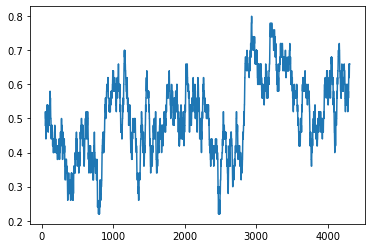

In [28]:
scores.win.rolling(50).mean().plot()

<AxesSubplot:>

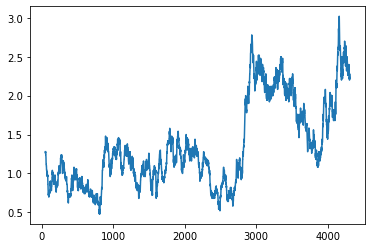

In [29]:
scores.left_score.rolling(50).mean().plot()

## Shot data

In [22]:
shots = sim.make_kick_dataset("SHOT_ATTEMPT", "GOAL_SCORED")
shots.shape

100%|██████████| 4110/4110 [00:55<00:00, 73.63it/s] 


(30441, 12)

In [23]:
shots.head()

,type,step,queued_at,eval_data.type,eval_data.pos,eval_data.view_of_net,eval_data.distance_to_net,eval_data.step,success,game_id,eval_data.dist_to_goalie,eval_data.game_id
0,SHOT_ATTEMPT,1403,1396.0,SHOT_EVALUATION,"[0.9514, 0.1083]",0.373145,0.118760,1396.0,0,0,NaN,NaN
1,SHOT_ATTEMPT,514,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0.271160,NaN
2,SHOT_ATTEMPT,1302,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0.272947,NaN
3,SHOT_ATTEMPT,1874,NaN,NaN,NaN,NaN,NaN,NaN,0,1,0.269569,NaN
4,SHOT_ATTEMPT,270,267.0,SHOT_EVALUATION,"[0.9539, 0.1259]",0.315229,0.134076,267.0,0,2,NaN,NaN


In [24]:
shots.describe()

,step,queued_at,eval_data.view_of_net,eval_data.distance_to_net,eval_data.step,success,game_id,eval_data.dist_to_goalie,eval_data.game_id
count,30441.000000,16350.000000,16350.000000,16350.000000,16350.000000,30441.000000,30441.000000,14091.000000,2.500000e+01
mean,1453.935317,1465.057859,0.297657,0.924550,1465.057859,0.137545,2456.764594,0.225415,2.020110e+15
std,841.681622,835.759674,0.594294,0.764801,835.759674,0.344427,1125.800901,0.080625,2.492175e+00
min,45.000000,42.000000,0.000000,0.001543,42.000000,0.000000,0.000000,0.008640,2.020110e+15
25%,720.000000,737.000000,0.000000,0.151445,737.000000,0.000000,1577.000000,0.227977,2.020110e+15
50%,1394.000000,1396.000000,0.044655,1.310352,1396.000000,0.000000,2861.000000,0.265003,2.020110e+15
75%,2168.000000,2176.750000,0.312303,1.642917,2176.750000,0.000000,3345.000000,0.273179,2.020110e+15
max,3000.000000,2998.000000,3.991806,2.092931,2998.000000,1.000000,3994.000000,0.279999,2.020110e+15


In [25]:
shots.groupby(shots["eval_data.dist_to_goalie"].notna()).success.mean()

eval_data.dist_to_goalie
False    0.020306
True     0.273579
Name: success, dtype: float64

In [26]:
shots.success.value_counts()

0    26254
1     4187
Name: success, dtype: int64

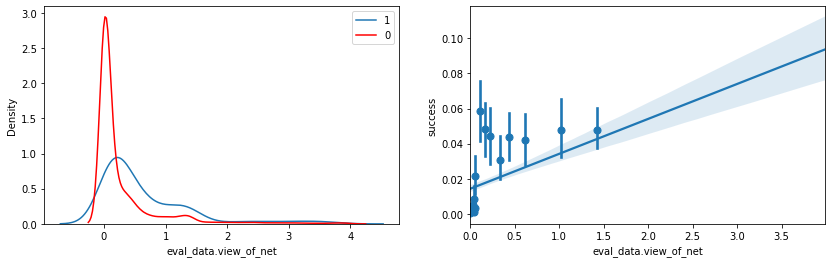

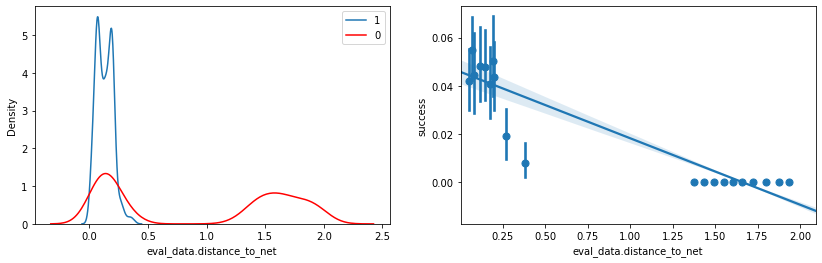

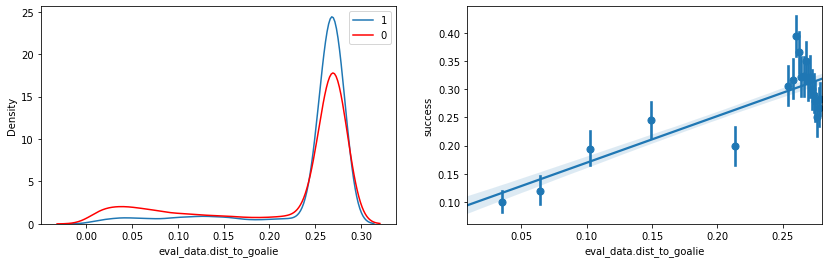

In [34]:
for col in [
    "eval_data.view_of_net",
    "eval_data.distance_to_net",
    "eval_data.dist_to_goalie",
#     "eval_data.step",
]:
    f, axes = plt.subplots(1, 2, figsize=(14, 4))
    sns.kdeplot(x=shots[col][shots.success == 1], label="1", ax=axes[0])
    sns.kdeplot(x=shots[col][shots.success == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=shots[col], y=shots.success, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

<AxesSubplot:xlabel='eval_data.dist_to_goalie', ylabel='success'>

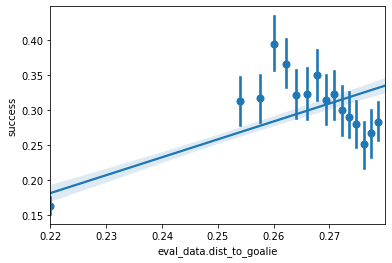

In [28]:
sns.regplot(x=shots["eval_data.dist_to_goalie"].clip(lower=0.22), y=shots.success, x_bins=20)

## Short pass data

In [34]:
short = sim.make_kick_dataset("SHORT_PASS_ATTEMPT", "NEW_POSSESSION")
short.shape

100%|██████████| 4310/4310 [01:20<00:00, 53.48it/s]


(91477, 24)

In [36]:
short.head()

,type,player,step,pass_error,pass_error_diff,queued_at,pos_score_data.base.val,pos_score_data.base.score,pos_score_data.posx.val,pos_score_data.posx.score,pos_score_data.dnet.val,pos_score_data.dnet.score,pos_score_data.view.val,pos_score_data.view.score,pos_score_data.dopp.val,pos_score_data.dopp.score,pos_score_data.total.val,pos_score_data.total.score,eval_data.pos_offside,eval_data.small_cone_angle,eval_data.pass_distance,eval_data.prb_success,success,game_id
0,SHORT_PASS_ATTEMPT,8,118,4.034051,43.490923,113.0,nan,15.0,-0.250401,4.372895,1.277726,-3.833179,0.066383,1.460430,0.100000,1.000000,nan,18.000145,0.0,20.937945,0.222479,0.766627,1,0
1,SHORT_PASS_ATTEMPT,10,351,18.583469,38.020829,348.0,nan,15.0,-0.081189,5.094579,1.112082,-3.336245,0.083362,1.833963,0.100000,1.000000,nan,19.592297,0.0,7.799308,0.155136,0.703105,1,0
2,SHORT_PASS_ATTEMPT,7,406,11.870377,32.759346,405.0,nan,15.0,0.058038,5.642162,1.014445,-3.043335,0.067431,1.483489,0.010902,0.109016,nan,19.191333,0.0,5.650786,0.011071,0.657083,1,0
3,SHORT_PASS_ATTEMPT,6,460,8.106431,26.005417,454.0,nan,15.0,0.109798,5.836337,0.895312,-2.685936,0.000000,0.000000,0.100000,1.000000,nan,19.150401,0.0,8.834191,0.206654,0.712526,1,0
4,SHORT_PASS_ATTEMPT,10,711,12.081261,24.380469,709.0,nan,15.0,-0.033056,5.288255,1.087934,-3.263803,0.097761,2.150752,0.100000,1.000000,nan,20.175203,0.0,13.024110,0.209247,0.720414,1,0


In [37]:
short.describe()

,player,step,pass_error,pass_error_diff,queued_at,pos_score_data.base.score,pos_score_data.posx.val,pos_score_data.posx.score,pos_score_data.dnet.val,pos_score_data.dnet.score,pos_score_data.view.val,pos_score_data.view.score,pos_score_data.dopp.val,pos_score_data.dopp.score,pos_score_data.total.score,eval_data.pos_offside,eval_data.small_cone_angle,eval_data.pass_distance,eval_data.prb_success,success,game_id
count,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.0,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000,91477.000000
mean,6.681395,1404.337812,11.196091,20.272236,1399.086623,15.0,0.096464,5.675506,0.922788,-2.768365,0.083638,1.840025,0.077108,0.771084,20.949334,0.000098,29.088758,0.231985,0.795765,0.770084,2083.633230
std,2.890746,867.809231,4.706485,19.119650,867.798287,0.0,0.280227,1.047784,0.275267,0.825801,0.093870,2.065132,0.024262,0.242618,4.778264,0.009919,39.055287,0.119627,0.071465,0.420781,1221.323163
min,0.000000,13.000000,0.125410,0.000003,10.000000,15.0,-1.031597,-0.250989,0.003539,-6.104408,0.000000,0.000000,0.000263,0.002634,10.411191,0.000000,0.000008,0.000190,0.344800,0.000000,0.000000
25%,5.000000,646.000000,7.459968,3.783857,641.000000,15.0,-0.048401,5.227030,0.764049,-3.203896,0.063178,1.389925,0.059178,0.591783,18.430307,0.000000,6.891792,0.141986,0.759503,1.000000,1087.000000
50%,7.000000,1368.000000,11.166194,14.114112,1362.000000,15.0,0.082634,5.735034,0.933716,-2.801148,0.078875,1.735245,0.084167,0.841669,20.380706,0.000000,16.807561,0.210602,0.791584,1.000000,1932.000000
75%,9.000000,2137.000000,14.975992,33.400098,2132.000000,15.0,0.254844,6.356097,1.067965,-2.292147,0.098733,2.172120,0.100000,1.000000,22.264313,0.000000,35.903324,0.300336,0.835702,1.000000,3109.000000
max,10.000000,3000.000000,19.999702,127.035362,2999.000000,15.0,1.028876,7.162920,2.034803,-0.010616,3.992798,87.841548,0.100000,1.000000,110.306483,1.000000,200.000000,0.905497,1.000000,1.000000,4309.000000


In [38]:
short["pos_score_data.view.val"] = short["pos_score_data.view.val"].clip(upper=1)

In [39]:
short["eval_data.small_cone_angle"] = short["eval_data.small_cone_angle"].clip(upper=40)

In [40]:
short_pass_cols = [
     "step",
     "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.pass_distance",
     "eval_data.prb_success",
]

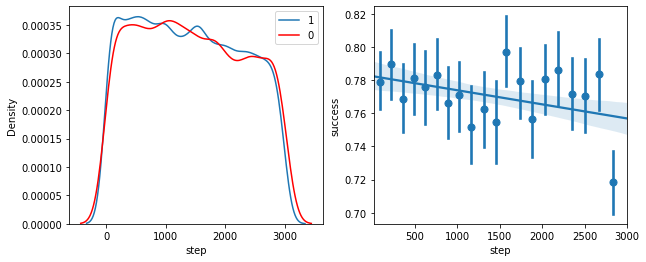

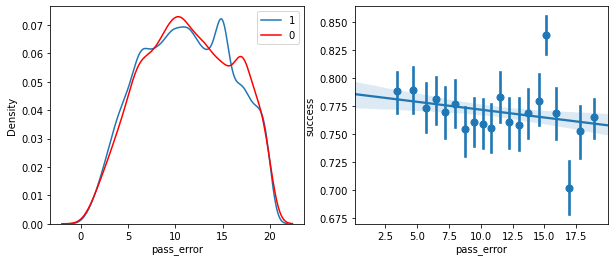

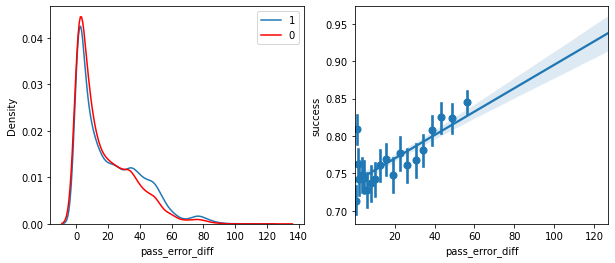

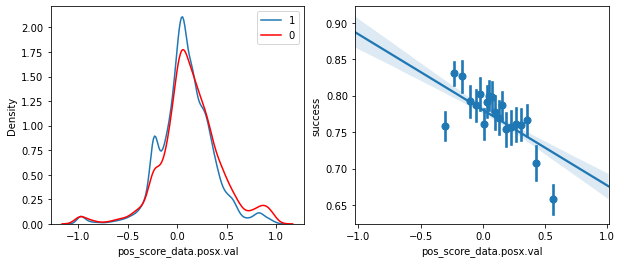

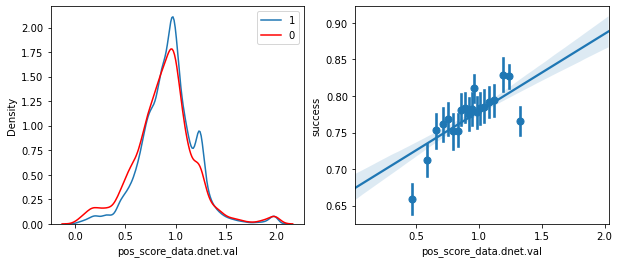

...

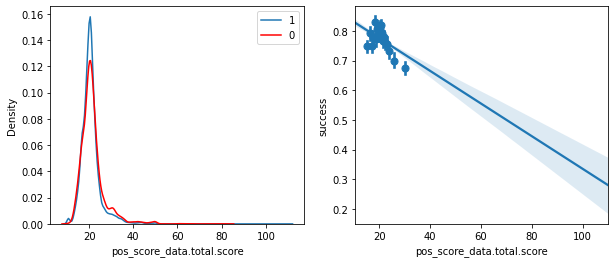

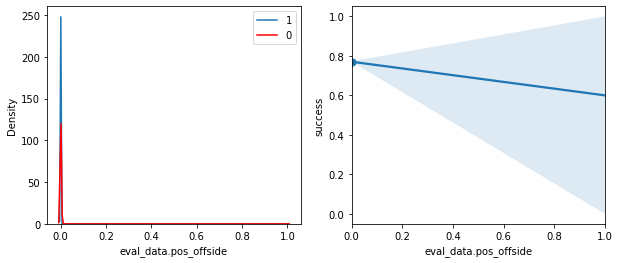

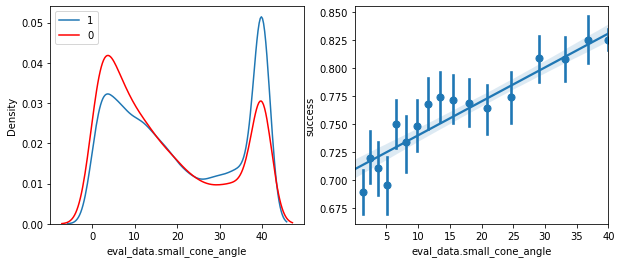

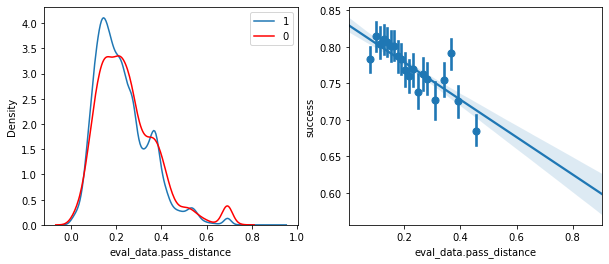

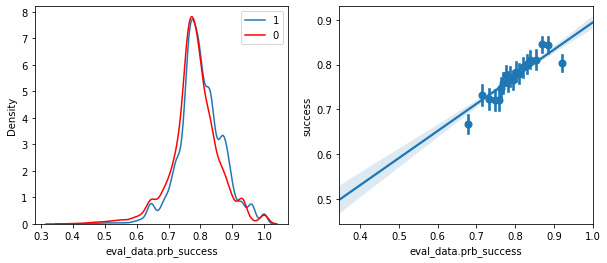

In [41]:
tmp = short.sample(30_000)
for col in short_pass_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.kdeplot(x=tmp[col][tmp.success == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.success == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.success, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [42]:
sm.OLS(short.success, sm.add_constant(short[short_pass_cols])).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                success   R-squared:                       0.019
Model:                            OLS   Adj. R-squared:                  0.019
Method:                 Least Squares   F-statistic:                     151.0
Date:                Wed, 04 Nov 2020   Prob (F-statistic):               0.00
Time:                        00:03:02   Log-Likelihood:                -49716.
No. Observations:               91477   AIC:                         9.946e+04
Df Residuals:                   91464   BIC:                         9.958e+04
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          0.9182      0.075     12.271      0.000       0.772       1.065
step                       -9.063e-06   1.59e-06     -5.696      0.000   -1.22e-05   -5.94e-06
pass_error                     0.0013      0.000      4.192      0.000       0.001       0.002
pass_error_diff                0.0011   7.99e-05     13.945      0.000       0.001       0.001
pos_score_data.posx.val       -0.3087      0.065     -4.750      0.000      -0.436      -0.181
pos_score_data.dnet.val       -0.3003      0.067     -4.498      0.000      -0.431      -0.169
pos_score_data.view.val       -0.1581      0.029     -5.546      0.000      -0.214      -0.102
pos_score_data.dopp.val        0.3348      0.063      5.330      0.000       0.212       0.458
pos_score_data.total.score    -0.0021      0.001     -4.121      0.000      -0.003      -0.001
eval_data.pos_offside          0.1821      0.141      1.288      0.198      -0.095       0.459
eval_data.small_cone_angle     0.0011      0.000      8.518      0.000       0.001       0.001
eval_data.pass_distance       -0.1688      0.014    -12.005      0.000      -0.196      -0.141
eval_data.prb_success          0.2301      0.027      8.579      0.000       0.178       0.283
==============================================================================
Omnibus:                    15522.267   Durbin-Watson:                   1.985
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            24229.304
Skew:                          -1.250   Prob(JB):                         0.00
Kurtosis:                       2.672   Cond. No.                     1.70e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.7e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [43]:
short_pass_cols = [
#      "step",
#      "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
#      "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
#      "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.pass_distance",
#      "eval_data.prb_success",
]

In [44]:
sm.OLS(short.success, sm.add_constant(short[short_pass_cols])).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                success   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.017
Method:                 Least Squares   F-statistic:                     258.6
Date:                Wed, 04 Nov 2020   Prob (F-statistic):               0.00
Time:                        00:03:02   Log-Likelihood:                -49844.
No. Observations:               91477   AIC:                         9.970e+04
Df Residuals:                   91470   BIC:                         9.977e+04
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
==============================================================================================
                                 coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------
const                          1.0630      0.065     16.285      0.000       0.935       1.191
pass_error_diff                0.0011   7.93e-05     13.868      0.000       0.001       0.001
pos_score_data.posx.val       -0.4030      0.064     -6.333      0.000      -0.528      -0.278
pos_score_data.dnet.val       -0.3249      0.065     -5.002      0.000      -0.452      -0.198
pos_score_data.dopp.val        0.3110      0.062      4.976      0.000       0.188       0.433
eval_data.small_cone_angle     0.0017      0.000     15.404      0.000       0.002       0.002
eval_data.pass_distance       -0.1512      0.013    -11.301      0.000      -0.177      -0.125
==============================================================================
Omnibus:                    15613.137   Durbin-Watson:                   1.987
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            24362.703
Skew:                          -1.253   Prob(JB):                         0.00
Kurtosis:                       2.662   Cond. No.                     2.76e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.76e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [45]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 201, 20)),
    "num_leaves": [10, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(short[short_pass_cols], short.success)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    3.7s
[Parallel(n_jobs=5)]: Done 100 out of 100 | elapsed:   12.1s finished


GridSearchCV(estimator=LGBMClassifier(), n_jobs=5,
             param_grid={'n_estimators': [10, 30, 50, 70, 90, 110, 130, 150,
                                          170, 190],
                         'num_leaves': [10, 30]},
             scoring='neg_log_loss', verbose=1)

In [46]:
grid_search.best_params_

{'n_estimators': 30, 'num_leaves': 30}

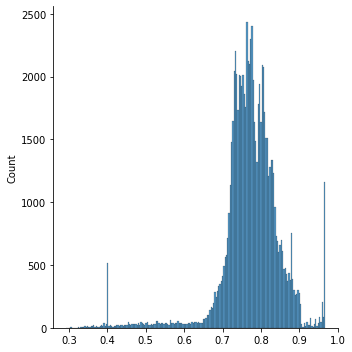

In [47]:
sns.displot(grid_search.predict_proba(short[short_pass_cols])[:, 1])

In [48]:
# pd.DataFrame(grid_search.cv_results_).sort_values("mean_test_score", ascending=False)

In [49]:
grid_search.best_estimator_.booster_.save_model("short_pass_model.txt")

In [69]:
short_pipe = make_pipeline(
    PolynomialFeatures(degree=2),
    RobustScaler(quantile_range=(0.05, 0.95)),
    RidgeClassifierCV(alphas=(0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0), cv=10)
)

In [70]:
short_pipe.fit(short[short_pass_cols], short.success)

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.3478e-19): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.35991e-19): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.34012e-19): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.34932e-19): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditione

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('robustscaler', RobustScaler(quantile_range=(0.05, 0.95))),
                ('ridgeclassifiercv',
                 RidgeClassifierCV(alphas=array([1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01]),
                                   cv=10))])

In [72]:
short_pipe.named_steps.ridgeclassifiercv.alpha_

1e-05

In [73]:
joblib.dump(short_pipe, "short_pass_model.pkl")

['short_pass_model.pkl']

## Long pass data

In [54]:
long = sim.make_kick_dataset("LONG_PASS_ATTEMPT", "NEW_POSSESSION")
long.shape

100%|██████████| 4310/4310 [01:16<00:00, 56.18it/s]


(60589, 25)

In [55]:
long.head()

,type,player,step,pass_error,pass_error_diff,queued_at,pos_score_data.base.val,pos_score_data.base.score,pos_score_data.posx.val,pos_score_data.posx.score,pos_score_data.dnet.val,pos_score_data.dnet.score,pos_score_data.view.val,pos_score_data.view.score,pos_score_data.dopp.val,pos_score_data.dopp.score,pos_score_data.total.val,pos_score_data.total.score,eval_data.pos_offside,eval_data.small_cone_angle,eval_data.forward_cone_angle,eval_data.pass_distance,eval_data.prb_success,success,game_id
0,LONG_PASS_ATTEMPT,4,334,14.275270,0.870537,330.0,nan,15.0,-0.185730,4.656633,1.187883,-3.563649,0.056638,1.246036,0.042846,0.428461,nan,17.767481,0.0,200.000000,58.399154,0.024611,0.943979,1,0
1,LONG_PASS_ATTEMPT,3,427,7.062886,13.767889,420.0,nan,15.0,-0.053537,5.206432,1.117460,-3.352379,0.071247,1.567427,0.008344,0.083436,nan,18.504917,0.0,15.325807,9.601414,0.021087,0.705983,1,0
2,LONG_PASS_ATTEMPT,6,497,14.096631,46.170707,494.0,nan,15.0,0.428034,6.934584,0.593229,-1.779686,0.118241,2.601311,0.100000,1.000000,nan,23.756209,0.0,11.612474,200.000000,0.177610,0.693200,1,0
3,LONG_PASS_ATTEMPT,10,740,8.385138,54.207010,737.0,nan,15.0,0.173929,6.070416,0.910623,-2.731869,0.072641,1.598104,0.100000,1.000000,nan,20.936651,0.0,61.289036,200.000000,0.085765,0.794222,1,0
4,LONG_PASS_ATTEMPT,1,879,3.504079,12.918232,875.0,nan,15.0,0.173981,6.070604,0.862832,-2.588497,0.078631,1.729877,0.081657,0.816574,nan,21.028557,0.0,50.021858,200.000000,0.103781,0.667549,1,0


In [56]:
long.describe()

,player,step,pass_error,pass_error_diff,queued_at,pos_score_data.base.score,pos_score_data.posx.val,pos_score_data.posx.score,pos_score_data.dnet.val,pos_score_data.dnet.score,pos_score_data.view.val,pos_score_data.view.score,pos_score_data.dopp.val,pos_score_data.dopp.score,pos_score_data.total.score,eval_data.pos_offside,eval_data.small_cone_angle,eval_data.forward_cone_angle,eval_data.pass_distance,eval_data.prb_success,success,game_id
count,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.0,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000,60589.000000
mean,6.810923,1383.973725,11.300471,19.187995,1378.949941,15.0,0.122411,5.769856,0.895828,-2.687485,0.095148,2.093266,0.075370,0.753696,21.215341,0.001172,41.663369,167.974192,0.286294,0.790817,0.757382,2374.595620
std,2.697858,869.223027,5.028815,18.859465,869.242729,0.0,0.288002,1.010267,0.281166,0.843498,0.189506,4.169140,0.025250,0.252497,6.525284,0.034212,63.463603,61.658185,0.183151,0.087488,0.428670,1179.526496
min,0.000000,13.000000,0.129239,0.000200,10.000000,15.0,-1.002118,-0.016571,0.003546,-6.011293,0.000000,0.000000,0.000405,0.004050,10.564431,0.000000,0.000029,0.002312,0.001001,0.221107,0.000000,0.000000
25%,6.000000,628.000000,6.755350,4.581938,623.000000,15.0,-0.121343,4.929255,0.695172,-3.420085,0.059386,1.306498,0.059455,0.594555,17.148410,0.000000,6.435972,164.434314,0.158248,0.742746,1.000000,1361.000000
50%,7.000000,1342.000000,11.251493,12.942765,1337.000000,15.0,0.129817,5.910162,0.891514,-2.674542,0.082291,1.810409,0.080258,0.802575,20.531447,0.000000,13.177067,200.000000,0.232164,0.778512,1.000000,2481.000000
75%,9.000000,2115.000000,16.247994,31.333874,2109.000000,15.0,0.321905,6.585201,1.140028,-2.085516,0.109338,2.405427,0.100000,1.000000,23.364705,0.000000,36.175757,200.000000,0.357463,0.838412,1.000000,3368.000000
max,10.000000,3000.000000,19.999503,102.165949,2998.000000,15.0,1.044599,7.162920,2.003764,-0.010638,3.998907,87.975964,0.100000,1.000000,110.574535,1.000000,200.000000,200.000000,0.879678,1.000000,1.000000,4309.000000


In [57]:
long["pos_score_data.view.val"] = long["pos_score_data.view.val"].clip(upper=1)

In [58]:
long_pass_cols = [
     "step",
     "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.forward_cone_angle",
     "eval_data.pass_distance",
     "eval_data.prb_success",
]

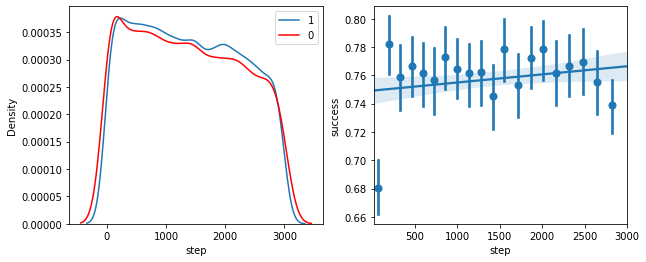

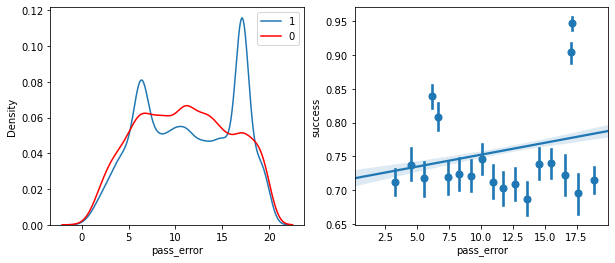

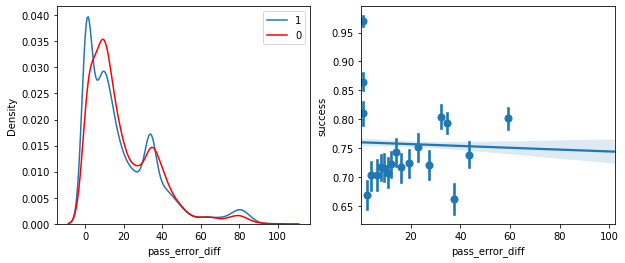

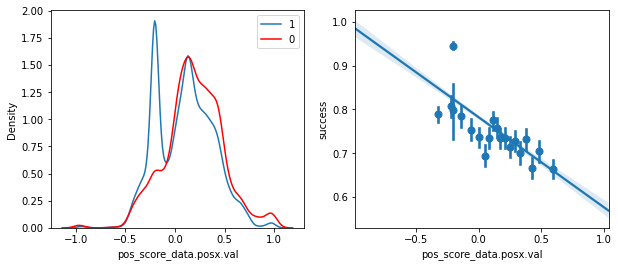

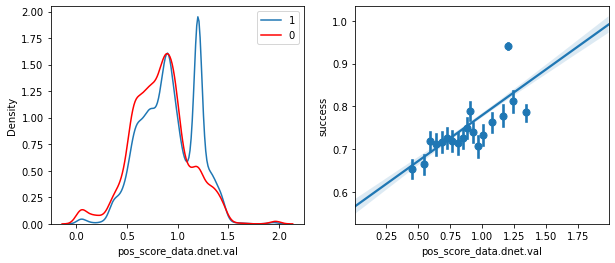

...

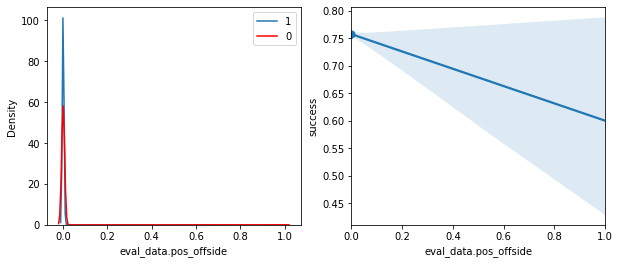

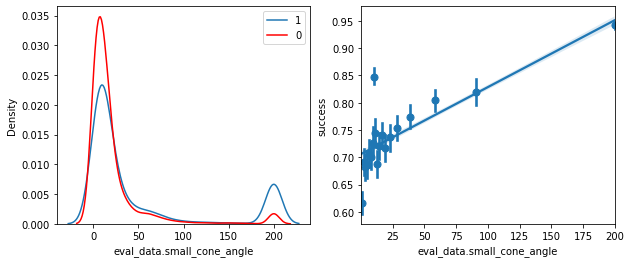

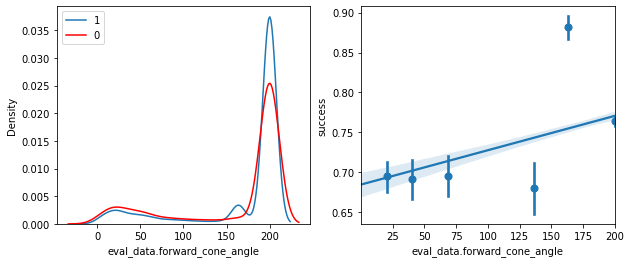

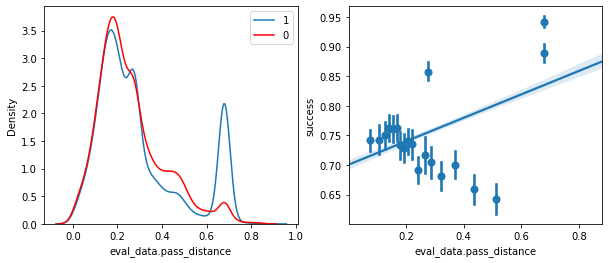

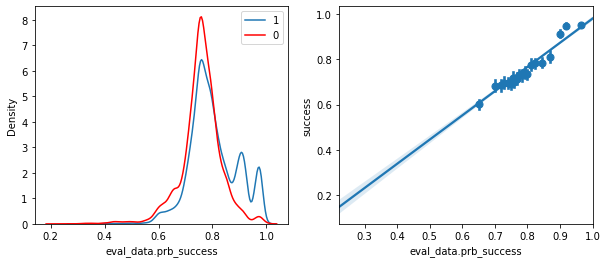

In [59]:
tmp = long.sample(30_000)
for col in long_pass_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.kdeplot(x=tmp[col][tmp.success == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.success == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.success, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [60]:
sm.OLS(long.success, sm.add_constant(long[long_pass_cols])).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                success   R-squared:                       0.052
Model:                            OLS   Adj. R-squared:                  0.052
Method:                 Least Squares   F-statistic:                     257.2
Date:                Wed, 04 Nov 2020   Prob (F-statistic):               0.00
Time:                        00:07:33   Log-Likelihood:                -33021.
No. Observations:               60589   AIC:                         6.607e+04
Df Residuals:                   60575   BIC:                         6.620e+04
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                           -0.4933      0.082     -6.026      0.000      -0.654      -0.333
step                         -4.047e-07   1.96e-06     -0.207      0.836   -4.24e-06    3.44e-06
pass_error                   -2.931e-05      0.000     -0.073      0.942      -0.001       0.001
pass_error_diff               1.622e-05      0.000      0.143      0.886      -0.000       0.000
pos_score_data.posx.val          0.5774      0.073      7.911      0.000       0.434       0.720
pos_score_data.dnet.val          0.6212      0.076      8.200      0.000       0.473       0.770
pos_score_data.view.val         -0.1671      0.031     -5.443      0.000      -0.227      -0.107
pos_score_data.dopp.val         -0.2343      0.115     -2.033      0.042      -0.460      -0.008
pos_score_data.total.score       0.0012      0.001      2.179      0.029       0.000       0.002
eval_data.pos_offside           -0.1093      0.055     -1.987      0.047      -0.217      -0.001
eval_data.small_cone_angle       0.0004   4.67e-05      9.084      0.000       0.000       0.001
eval_data.forward_cone_angle  2.189e-05   4.67e-05      0.469      0.639   -6.96e-05       0.000
eval_data.pass_distance          0.0038      0.013      0.304      0.761      -0.021       0.028
eval_data.prb_success            0.7689      0.034     22.509      0.000       0.702       0.836
==============================================================================
Omnibus:                     9824.957   Durbin-Watson:                   1.980
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            12765.145
Skew:                          -1.087   Prob(JB):                         0.00
Kurtosis:                       2.427   Cond. No.                     1.31e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.31e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [61]:
long_pass_cols = [
#      "step",
#      "pass_error",
     "pass_error_diff",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
#      "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
#      "eval_data.pos_offside",
     "eval_data.small_cone_angle",
     "eval_data.forward_cone_angle",
     "eval_data.pass_distance",
#      "eval_data.prb_success",
]

In [62]:
sm.OLS(long.success, sm.add_constant(long[long_pass_cols])).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                success   R-squared:                       0.042
Model:                            OLS   Adj. R-squared:                  0.042
Method:                 Least Squares   F-statistic:                     380.8
Date:                Wed, 04 Nov 2020   Prob (F-statistic):               0.00
Time:                        00:07:33   Log-Likelihood:                -33344.
No. Observations:               60589   AIC:                         6.670e+04
Df Residuals:                   60581   BIC:                         6.678e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
================================================================================================
                                   coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------------
const                           -0.0613      0.074     -0.826      0.409      -0.207       0.084
pass_error_diff                  0.0011      0.000     10.903      0.000       0.001       0.001
pos_score_data.posx.val          0.6325      0.073      8.704      0.000       0.490       0.775
pos_score_data.dnet.val          0.7611      0.074     10.256      0.000       0.616       0.907
pos_score_data.dopp.val         -0.3096      0.115     -2.684      0.007      -0.536      -0.083
eval_data.small_cone_angle       0.0011   3.55e-05     31.694      0.000       0.001       0.001
eval_data.forward_cone_angle  7.751e-05   4.66e-05      1.662      0.096   -1.39e-05       0.000
eval_data.pass_distance          0.0043      0.012      0.376      0.707      -0.018       0.027
==============================================================================
Omnibus:                    10186.103   Durbin-Watson:                   1.984
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            13174.579
Skew:                          -1.103   Prob(JB):                         0.00
Kurtosis:                       2.406   Cond. No.                     1.44e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.44e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [59]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 101, 10)),
    "num_leaves": [5, 10, 20, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(long[long_pass_cols], long.success)

Fitting 5 folds for each of 40 candidates, totalling 200 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:    2.4s
[Parallel(n_jobs=5)]: Done 190 tasks      | elapsed:   11.4s
[Parallel(n_jobs=5)]: Done 200 out of 200 | elapsed:   12.2s finished


GridSearchCV(estimator=LGBMClassifier(), n_jobs=5,
             param_grid={'n_estimators': [10, 20, 30, 40, 50, 60, 70, 80, 90,
                                          100],
                         'num_leaves': [5, 10, 20, 30]},
             scoring='neg_log_loss', verbose=1)

In [60]:
grid_search.best_params_

{'n_estimators': 40, 'num_leaves': 30}

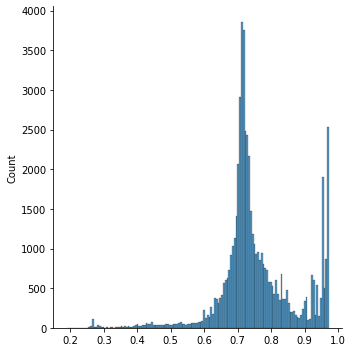

In [61]:
sns.displot(grid_search.predict_proba(long[long_pass_cols])[:, 1])

In [62]:
# pd.DataFrame(grid_search.cv_results_).sort_values("mean_test_score", ascending=False)

In [63]:
grid_search.best_estimator_.booster_.save_model("long_pass_model.txt")

In [74]:
long_pipe = make_pipeline(
    PolynomialFeatures(degree=2),
    RobustScaler(quantile_range=(0.05, 0.95)),
    RidgeClassifierCV(alphas=(0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0), cv=10)
)

In [75]:
long_pipe.fit(long[long_pass_cols], long.success)

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=5.03149e-22): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=4.24609e-22): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=4.13881e-22): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=4.28044e-22): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-condition

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=3.52467e-18): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=3.43564e-18): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=3.56784e-18): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=3.56737e-18): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-condition

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('robustscaler', RobustScaler(quantile_range=(0.05, 0.95))),
                ('ridgeclassifiercv',
                 RidgeClassifierCV(alphas=array([1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01]),
                                   cv=10))])

In [76]:
long_pipe.named_steps.ridgeclassifiercv.alpha_

0.1

In [77]:
joblib.dump(long_pipe, "long_pass_model.pkl")

['long_pass_model.pkl']

## Handling data

In [78]:
handle = sim.make_handling_dataset()
handle.shape

100%|██████████| 4310/4310 [06:08<00:00, 11.70it/s]


(1949613, 21)

In [90]:
handle.head()

,type,step,pos_score_data.base.val,pos_score_data.base.score,pos_score_data.posx.val,pos_score_data.posx.score,pos_score_data.dnet.val,pos_score_data.dnet.score,pos_score_data.view.val,pos_score_data.view.score,pos_score_data.dopp.val,pos_score_data.dopp.score,pos_score_data.total.val,pos_score_data.total.score,eval_data.close_opp_dir_change,eval_data.small_cone_angle,eval_data.outside_pitch,eval_data.angle_diff,eval_data.prb_failure,failure,game_id
0,MOVE_WITH_BALL_ATTEMPT,15,nan,15.0,-0.152528,4.798400,1.154773,-3.464319,0.055704,1.225495,0.053819,0.538188,nan,18.097763,0.000000,200.000000,0.0,72.010567,0.068329,0,0
1,MOVE_WITH_BALL_ATTEMPT,16,nan,15.0,-0.092188,5.049640,1.092190,-3.276569,0.000000,0.000000,0.045470,0.454697,nan,17.227769,0.000000,200.000000,0.0,0.048587,0.044900,0,0
2,MOVE_WITH_BALL_ATTEMPT,17,nan,15.0,-0.101452,5.011589,1.102197,-3.306591,0.025146,0.553211,0.061363,0.613631,nan,17.871840,0.000000,24.814453,0.0,33.895579,0.099995,0,0
3,MOVE_WITH_BALL_ATTEMPT,53,nan,15.0,-0.347348,3.927267,1.350510,-4.051530,0.000000,0.000000,0.054366,0.543656,nan,15.419393,0.006828,56.947543,0.0,26.413845,0.070661,0,0
4,MOVE_WITH_BALL_ATTEMPT,54,nan,15.0,-0.361294,3.861017,1.364549,-4.093647,0.000000,0.000000,0.056777,0.567772,nan,15.335143,0.006622,58.305711,0.0,25.052576,0.053177,0,0


In [91]:
handle.describe()

,step,pos_score_data.base.score,pos_score_data.posx.val,pos_score_data.posx.score,pos_score_data.dnet.val,pos_score_data.dnet.score,pos_score_data.view.val,pos_score_data.view.score,pos_score_data.dopp.val,pos_score_data.dopp.score,pos_score_data.total.score,eval_data.close_opp_dir_change,eval_data.small_cone_angle,eval_data.outside_pitch,eval_data.angle_diff,eval_data.prb_failure,failure,game_id
count,1.949613e+06,1949613.0,1.949613e+06,1.949613e+06,1.949613e+06,1.949613e+06,1.949613e+06,1.949613e+06,1.949613e+06,1.949613e+06,1.949613e+06,1.949613e+06,1.949613e+06,1949613.0,1.949613e+06,1.949613e+06,1.949613e+06,1.949613e+06
mean,1.384226e+03,15.0,1.750934e-01,5.769202e+00,8.694929e-01,-2.608479e+00,8.742924e-02,1.924966e+00,6.624279e-02,6.624279e-01,2.162444e+01,5.839051e-03,1.005550e+02,0.0,3.384234e+01,5.591357e-02,6.532066e-02,1.745547e+03
std,8.749626e+02,0.0,4.183911e-01,1.421795e+00,3.886226e-01,1.165868e+00,5.282728e-02,1.196162e+00,2.142577e-02,2.142577e-01,5.434652e+00,3.745401e-03,5.385901e+01,0.0,4.034544e+01,5.316611e-02,2.470909e-01,1.175644e+03
min,1.000000e+01,15.0,-9.599958e-01,3.066317e-01,4.017459e-02,-5.983216e+00,0.000000e+00,0.000000e+00,5.326705e-05,5.326705e-04,1.017787e+01,0.000000e+00,2.605050e-04,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,6.210000e+02,15.0,-1.393389e-01,4.854011e+00,5.647283e-01,-3.479938e+00,5.958975e-02,1.310974e+00,5.020382e-02,5.020382e-01,1.801521e+01,4.342002e-03,5.959441e+01,0.0,5.044141e+00,2.026572e-02,0.000000e+00,7.000000e+02
50%,1.326000e+03,15.0,1.954978e-01,6.147594e+00,8.326019e-01,-2.497806e+00,8.355827e-02,1.838282e+00,6.471038e-02,6.471038e-01,2.116013e+01,6.214730e-03,8.796441e+01,0.0,1.963328e+01,4.187346e-02,0.000000e+00,1.689000e+03
75%,2.129000e+03,15.0,4.911989e-01,7.135351e+00,1.159979e+00,-1.694185e+00,1.074642e-01,2.364212e+00,8.306990e-02,8.306990e-01,2.386070e+01,8.475570e-03,1.385981e+02,0.0,4.493067e+01,6.895995e-02,0.000000e+00,2.572000e+03
max,3.000000e+03,15.0,9.599957e-01,7.162920e+00,1.994405e+00,-1.205238e-01,1.000000e+00,4.654512e+01,1.000000e-01,1.000000e+00,6.927461e+01,1.840316e-02,2.000000e+02,0.0,1.800000e+02,6.103036e-01,1.000000e+00,4.309000e+03


In [92]:
handle["pos_score_data.view.val"] = handle["pos_score_data.view.val"].clip(upper=1)

In [93]:
handle_cols = [
     "step",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
     "pos_score_data.total.score",
     "eval_data.close_opp_dir_change",
     "eval_data.small_cone_angle",
#      "eval_data.outside_pitch",
     "eval_data.angle_diff",
     "eval_data.prb_failure",
]

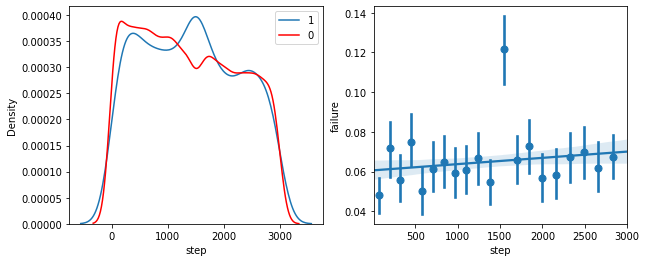

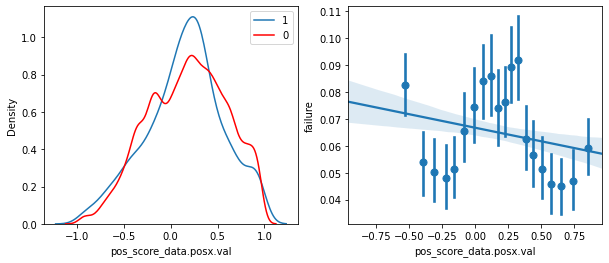

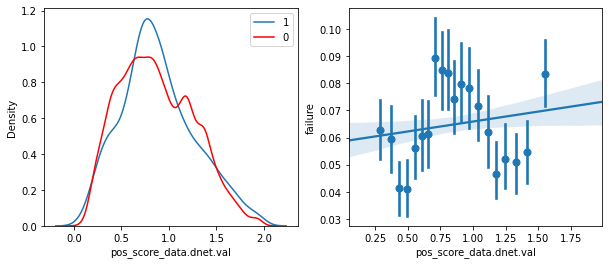

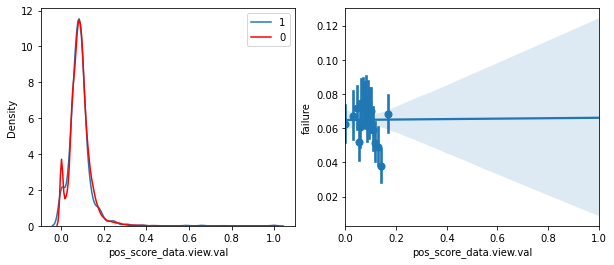

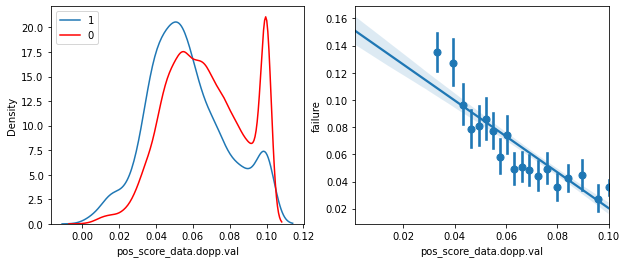

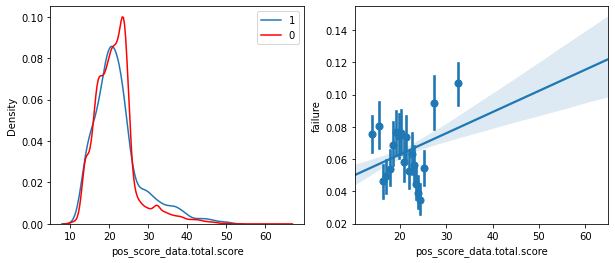

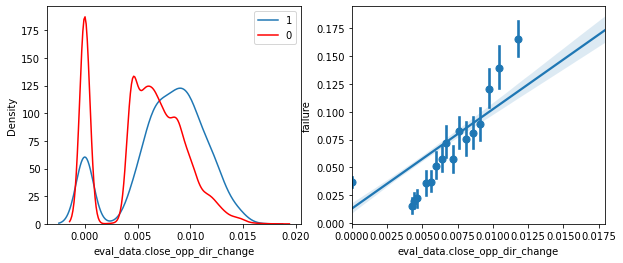

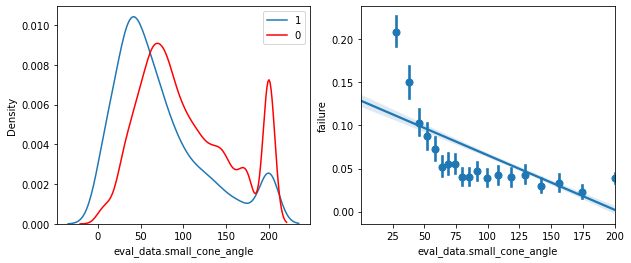

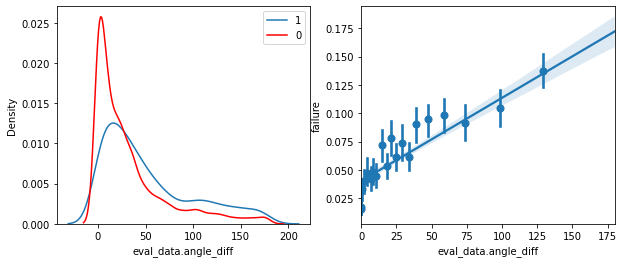

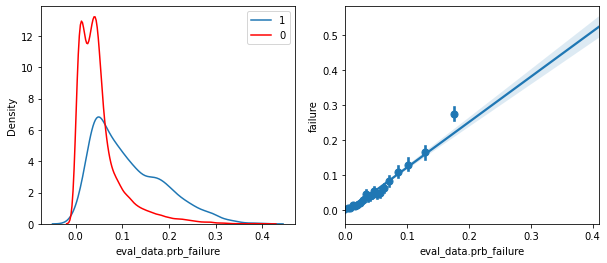

In [94]:
tmp = handle.sample(30_000)
for col in handle_cols:
    f, axes = plt.subplots(1, 2, figsize=(10, 4))
    sns.kdeplot(x=tmp[col][tmp.failure == 1], label="1", ax=axes[0])
    sns.kdeplot(x=tmp[col][tmp.failure == 0], label="0", color="red", ax=axes[0])
    sns.regplot(x=tmp[col], y=tmp.failure, x_bins=20, ax=axes[1])
    axes[0].legend()
    plt.show()

In [95]:
sm.OLS(handle.failure, sm.add_constant(handle[handle_cols])).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                failure   R-squared:                       0.076
Model:                            OLS   Adj. R-squared:                  0.076
Method:                 Least Squares   F-statistic:                 1.612e+04
Date:                Wed, 04 Nov 2020   Prob (F-statistic):               0.00
Time:                        00:19:32   Log-Likelihood:                 36639.
No. Observations:             1949613   AIC:                        -7.326e+04
Df Residuals:                 1949602   BIC:                        -7.312e+04
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                             -0.0616      0.006    -11.029      0.000      -0.073      -0.051
step                            3.225e-06   1.95e-07     16.556      0.000    2.84e-06    3.61e-06
pos_score_data.posx.val           -0.0138      0.004     -3.254      0.001      -0.022      -0.005
pos_score_data.dnet.val            0.0147      0.005      3.050      0.002       0.005       0.024
pos_score_data.view.val           -0.0758      0.005    -14.202      0.000      -0.086      -0.065
pos_score_data.dopp.val           -0.2291      0.010    -22.665      0.000      -0.249      -0.209
pos_score_data.total.score         0.0036   6.49e-05     55.593      0.000       0.003       0.004
eval_data.close_opp_dir_change    -0.5586      0.056     -9.971      0.000      -0.668      -0.449
eval_data.small_cone_angle        -0.0001   4.47e-06    -23.425      0.000      -0.000    -9.6e-05
eval_data.angle_diff               0.0002   4.79e-06     42.821      0.000       0.000       0.000
eval_data.prb_failure              1.1213      0.004    267.020      0.000       1.113       1.130
==============================================================================
Omnibus:                  1242878.536   Durbin-Watson:                   0.432
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         10226954.715
Skew:                           3.150   Prob(JB):                         0.00
Kurtosis:                      12.285   Cond. No.                     5.40e+05
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.4e+05. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [96]:
handle_cols = [
#      "step",
     "pos_score_data.posx.val",
     "pos_score_data.dnet.val",
     "pos_score_data.view.val",
     "pos_score_data.dopp.val",
#      "pos_score_data.total.score",
     "eval_data.close_opp_dir_change",
     "eval_data.small_cone_angle",
#      "eval_data.outside_pitch",
     "eval_data.angle_diff",
#      "eval_data.prb_failure",
]

In [97]:
sm.OLS(handle.failure, sm.add_constant(handle[handle_cols])).fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                failure   R-squared:                       0.040
Model:                            OLS   Adj. R-squared:                  0.040
Method:                 Least Squares   F-statistic:                 1.161e+04
Date:                Wed, 04 Nov 2020   Prob (F-statistic):               0.00
Time:                        00:19:33   Log-Likelihood:                -1004.9
No. Observations:             1949613   AIC:                             2026.
Df Residuals:                 1949605   BIC:                             2126.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
const                              0.3436      0.005     70.347      0.000       0.334       0.353
pos_score_data.posx.val           -0.2323      0.004    -56.135      0.000      -0.240      -0.224
pos_score_data.dnet.val           -0.2294      0.005    -49.915      0.000      -0.238      -0.220
pos_score_data.view.val            0.0344      0.005      7.138      0.000       0.025       0.044
pos_score_data.dopp.val           -0.5532      0.010    -54.214      0.000      -0.573      -0.533
eval_data.close_opp_dir_change     2.8721      0.056     51.625      0.000       2.763       2.981
eval_data.small_cone_angle        -0.0004   4.38e-06   -101.926      0.000      -0.000      -0.000
eval_data.angle_diff               0.0007   4.52e-06    154.462      0.000       0.001       0.001
==============================================================================
Omnibus:                  1294338.320   Durbin-Watson:                   0.420
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         11086955.338
Skew:                           3.315   Prob(JB):                         0.00
Kurtosis:                      12.619   Cond. No.                     3.81e+04
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 3.81e+04. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [73]:
model = LGBMClassifier()
grid = {
    "n_estimators": list(range(10, 201, 20)),
    "num_leaves": [10, 30],
}
# neg_log_loss, neg_brier_score, roc_auc, f1
grid_search = GridSearchCV(model, grid, scoring="neg_log_loss", verbose=1, n_jobs=5)
grid_search.fit(handle[handle_cols], handle.failure)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=5)]: Using backend LokyBackend with 5 concurrent workers.
[Parallel(n_jobs=5)]: Done  40 tasks      | elapsed:   56.8s
[Parallel(n_jobs=5)]: Done 100 out of 100 | elapsed:  3.9min finished


GridSearchCV(estimator=LGBMClassifier(), n_jobs=5,
             param_grid={'n_estimators': [10, 30, 50, 70, 90, 110, 130, 150,
                                          170, 190],
                         'num_leaves': [10, 30]},
             scoring='neg_log_loss', verbose=1)

In [74]:
grid_search.best_params_

{'n_estimators': 30, 'num_leaves': 30}

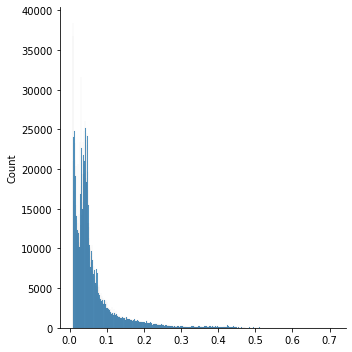

In [75]:
sns.displot(grid_search.predict_proba(handle[handle_cols])[:, 1])

In [76]:
grid_search.best_estimator_.booster_.save_model("handle_model.txt")

In [98]:
handle_pipe = make_pipeline(
    PolynomialFeatures(degree=2),
    RobustScaler(quantile_range=(0.05, 0.95)),
    RidgeClassifierCV(alphas=(0.00001, 0.0001, 0.001, 0.01, 0.1, 1.0, 10.0), cv=10)
)

In [101]:
handle_pipe.fit(handle[handle_cols], handle.failure)

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.92252e-29): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.92432e-29): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.94267e-29): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=2.00424e-29): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-condition

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=2.02805e-26): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.90432e-25): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.90613e-25): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-conditioned matrix (rcond=1.92423e-25): result may not be accurate.

/Users/liamkirwin/.local/share/virtualenvs/cicada-PMgweW5G/lib/python3.8/site-packages/sklearn/linear_model/_ridge.py:147: LinAlgWarning:

Ill-condition

Pipeline(steps=[('polynomialfeatures', PolynomialFeatures()),
                ('robustscaler', RobustScaler(quantile_range=(0.05, 0.95))),
                ('ridgeclassifiercv',
                 RidgeClassifierCV(alphas=array([1.e-05, 1.e-04, 1.e-03, 1.e-02, 1.e-01, 1.e+00, 1.e+01]),
                                   cv=10))])

In [102]:
handle_pipe.named_steps.ridgeclassifiercv.alpha_

10.0

In [103]:
joblib.dump(handle_pipe, "handle_model.pkl")

['handle_model.pkl']

## Position score data

In [77]:
pos_score = sim.make_position_score_dataset()
pos_score.shape

100%|██████████| 4110/4110 [03:20<00:00, 20.52it/s] 


(1568884, 16)

In [94]:
pos_score["pred"] = np.random.uniform(size=len(pos_score))

In [95]:
pos_score.head()

,type,step,reward,game_id,base.val,base.score,posx.val,posx.score,dnet.val,dnet.score,view.val,view.score,dopp.val,dopp.score,total.val,total.score,pred,logx.val,dnet.val2,view.val2,dopp.val2,target
0,ACTIVE_POS_SCORE,13,0,1081,nan,15.0,-0.182207,4.671801,1.182213,-3.546640,0.0,0.0,0.1,1.0,nan,17.125161,0.462854,0.259545,1.397628,0.0,0.01,NaN
1,ACTIVE_POS_SCORE,14,0,1081,nan,15.0,-0.182799,4.669252,1.182814,-3.548441,0.0,0.0,0.1,1.0,nan,17.120811,0.555835,0.259403,1.399048,0.0,0.01,19.009018
2,ACTIVE_POS_SCORE,15,0,1081,nan,15.0,-0.183371,4.666792,1.183398,-3.550195,0.0,0.0,0.1,1.0,nan,17.116598,0.884032,0.259266,1.400431,0.0,0.01,19.009018
3,ACTIVE_POS_SCORE,16,0,1081,nan,15.0,-0.183715,4.665310,1.183764,-3.551291,0.0,0.0,0.1,1.0,nan,17.114019,0.863377,0.259184,1.401297,0.0,0.01,19.009018
4,ACTIVE_POS_SCORE,17,0,1081,nan,15.0,-0.183844,4.664758,1.183923,-3.551769,0.0,0.0,0.1,1.0,nan,17.112989,0.565973,0.259153,1.401674,0.0,0.01,19.009018


In [96]:
pos_score["logx.val"] = np.log10(pos_score["posx.val"] + 2.0)
pos_score["dnet.val2"] = pos_score["dnet.val"] ** 2
pos_score["view.val2"] = pos_score["view.val"] ** 2
pos_score["dopp.val2"] = pos_score["dopp.val"] ** 2

In [97]:
X_cols = [
    "posx.val",
    "dnet.val",
    "view.val",
    "dopp.val",
    "logx.val",
    "dnet.val2",
    "view.val2",
    "dopp.val2",
]

In [98]:
for _ in tqdm(range(1_000)):
    pos_score["target"] = (pos_score.reward * 50.0 + pos_score.pred.shift(-1) * 0.99).clip(lower=0.0, upper=50.0)
    pos_score.loc[pos_score.game_id != pos_score.game_id.shift(1), "target"] = np.nan
    X = sm.add_constant(pos_score[X_cols])
    mask = pos_score.target.notna()
    ols_model = sm.OLS(pos_score.target[mask], X[mask], missing="drop").fit()
    pos_score["pred"] = ols_model.predict(X)

In [99]:
ols_model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                 target   R-squared:                       0.924
Model:                            OLS   Adj. R-squared:                  0.924
Method:                 Least Squares   F-statistic:                 2.380e+06
Date:                Tue, 03 Nov 2020   Prob (F-statistic):               0.00
Time:                        13:12:46   Log-Likelihood:            -3.7370e+06
No. Observations:             1566473   AIC:                         7.474e+06
Df Residuals:                 1566464   BIC:                         7.474e+06
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const        206.1969      0.287    718.635      0.000     205.634     206.759
posx.val     -36.5569      0.182   -200.773      0.000     -36.914     -36.200
dnet.val    -114.3213      0.103  -1104.708      0.000    -114.524    -114.118
view.val      13.8818      0.052    264.602      0.000      13.779      13.985
dopp.val      77.6146      0.327    237.349      0.000      76.974      78.255
logx.val    -244.9294      0.986   -248.512      0.000    -246.861    -242.998
dnet.val2      0.1139      0.063      1.807      0.071      -0.010       0.237
view.val2     -6.2695      0.037   -167.756      0.000      -6.343      -6.196
dopp.val2   -468.0299      3.113   -150.337      0.000    -474.132    -461.928
==============================================================================
Omnibus:                   617461.418   Durbin-Watson:                   1.420
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         99953352.163
Skew:                          -0.818   Prob(JB):                         0.00
Kurtosis:                      42.099   Cond. No.                     2.77e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.77e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [105]:
ols_model.params.tolist()

[206.19686780260966,
 -36.55692791193213,
 -114.32130831483998,
 13.881842569566206,
 77.61455040563527,
 -244.9294098388413,
 0.11388191940208145,
 -6.2695120111210825,
 -468.0299266323603]

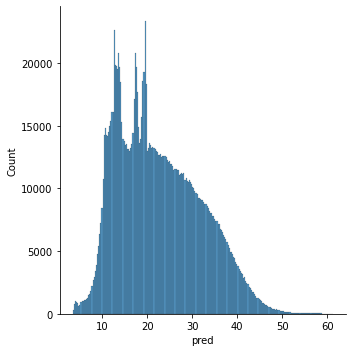

In [85]:
sns.displot(pos_score.pred)

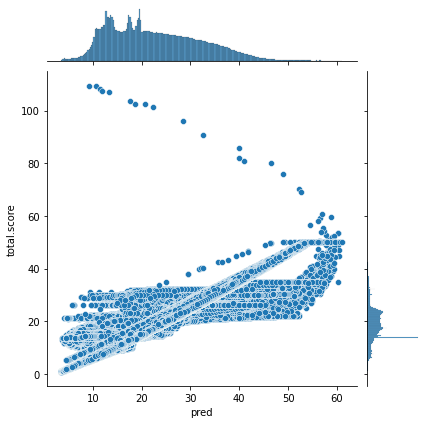

In [86]:
sns.jointplot(x=pos_score.pred, y=pos_score["total.score"])

In [87]:
X_cols = [
    "posx.val",
    "dnet.val",
    "view.val",
    "dopp.val",
]

In [89]:
for _ in tqdm(range(1_000)):
    pos_score["target"] = (pos_score.reward * 50.0 + pos_score.pred.shift(-1) * 0.99).clip(lower=0.0, upper=50.0)
    pos_score.loc[pos_score.game_id != pos_score.game_id.shift(1), "target"] = np.nan
    X = sm.add_constant(pos_score[X_cols])
    mask = pos_score.target.notna()
    lgb_model = LGBMRegressor(num_leaves=2).fit(X[mask], pos_score.target[mask])
#     model = sm.OLS(pos_score.target[mask], X[mask], missing="drop").fit()
    pos_score["pred"] = lgb_model.predict(X)

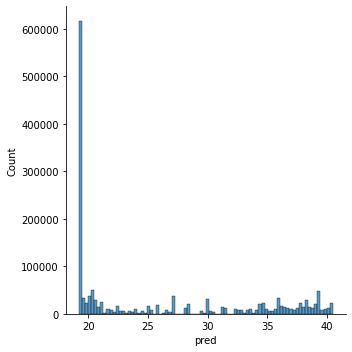

In [90]:
sns.displot(pos_score.pred)

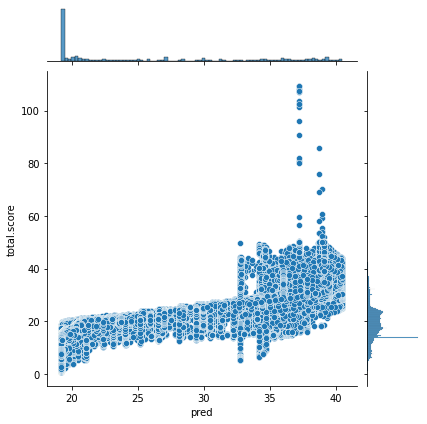

In [91]:
sns.jointplot(x=pos_score.pred, y=pos_score["total.score"])

In [92]:
model.booster_.save_model("position_model.txt")

# Ball physics

In [ ]:
ball_cols = [c for c in df.columns if c.startswith("ball")]
df[[c + "_diff" for c in ball_cols]] = df[ball_cols].diff().shift(-1)
df["ball_in_air"] = df.ball_pos_z > 0.7
df["ball_vel"] = (df.ball_dir_x**2 + df.ball_dir_y**2 + df.ball_dir_z**2) ** 0.5

In [ ]:
df.head()

In [ ]:
df[df.ball_in_air].head(30)

In [ ]:
df.ball_pos_z.plot(figsize=(15, 5))

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_z != 0.0)].plot.scatter(
    x="ball_dir_z",
    y="ball_pos_z_diff",
#     c="ball_vel",
    figsize=(15, 10),
)
ax.plot([-1, 1], [-1, 1])
ax.set_ylim(-1, 1)
abline(ax, 1, -0.05)

In [ ]:
df[df.ball_in_air & (df.ball_dir_z != 0.0) & (df.ball_dir_z_diff > 1)]
df[(df.step >= 1660) & (df.step <= 1670)]

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_z != 0.0)].plot.scatter(
    x="ball_dir_z",
    y="ball_dir_z_diff",
#     c="ball_pos_z",
    figsize=(15, 10),
)
ax.plot([-1, 1], [-1, 1])
abline(ax, -0.01, -0.08)

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_x != 0.0)].plot.scatter(x="ball_dir_x", y="ball_pos_x_diff")
ax.plot([-0.1, 0.1], [-0.1, 0.1])

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_x != 0.0)].plot.scatter(x="ball_dir_x", y="ball_dir_x_diff")
ax.plot([-0.04, 0.04], [-0.04, 0.04])
abline(ax, -0.05, 0)

In [ ]:
ax = df[df.ball_in_air & (df.ball_dir_y != 0.0)].plot.scatter(x="ball_dir_y", y="ball_dir_y_diff")
ax.plot([-0.01, 0.01], [-0.01, 0.01])
abline(ax, -0.05, 0)

In [ ]:
def abline(ax, slope, intercept):
    x_vals = np.array(ax.get_xlim())
    y_vals = intercept + slope * x_vals
    ax.plot(x_vals, y_vals, '--')

In [ ]:
(df.ball_pos_z_diff - df.ball_dir_z).mean()